<a href="https://colab.research.google.com/github/rishsans/Dugout_Detection/blob/main/YOLOv8_e100.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Dug-Out Detection - Use Case of Object Detection

In [ ]:
!pip install ultralytics



     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 628.0/628.0 kB 19.0 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

#Mounting drive

Mounted at /content/drive


In [ ]:
!yolo task=detect mode=predict model=yolov8n.pt conf=0.4 source= '/content/drive/MyDrive/obj/1011.png'

# Task is to DETECT for PREDICTING in 1011.png using model "yolo8n.pt". (Testing on images in COCO dataset). ---> yolo8n.pt uploaded

100% 6.23M/6.23M [00:00<00:00, 117MB/s]
Ultralytics YOLOv8.0.132 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n summary (fused): 168 layers, 3151904 parameters, 0 gradients

image 1/1 /content/drive/MyDrive/obj/1011.png: 384x640 5 airplanes, 68.1ms
Speed: 12.9ms preprocess, 68.1ms inference, 29.4ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict


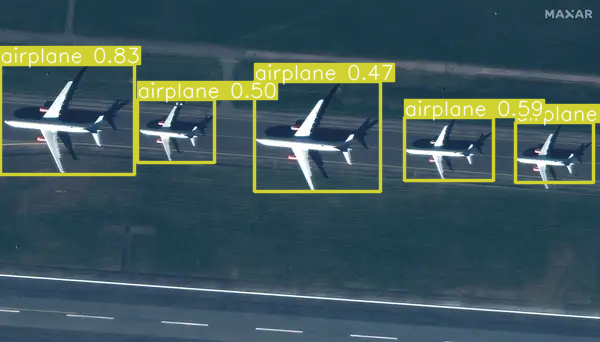

In [ ]:
from IPython.display import Image
Image("/content/runs/detect/predict/1011.png", width=800, height=400)

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="xXPNVVZFAb5jq2qu46AO")
project = rf.workspace("obj-ga6fk").project("obj_det-krkmi")
dataset = project.version(4).download("yolov8")

#import dataset from roboflow platform ---> Obj det folder uploaded

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.4/57.4 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.3/155.3 kB 13.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 9.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.6/55.6 kB 7.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 8.1 MB/s eta 0:00:00
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9657 sha256=a5258c430ad05385d4d0134180cd0dc329ec8ec90c00a2ece99408a5124dd962
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built wget
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.1.0
    Uninstalling pyparsing-3.1.0:
      Successfully uninstalled pyparsing-3.1.0
  Attempting uninstall: idna
    Found e

loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics<=8.0.20 is required but found version=8.0.132, to fix: `pip install ultralytics<=8.0.20`


Extracting Dataset Version Zip to Obj_Det-4 in yolov8:: 100%|██████████| 3812/3812 [00:00<00:00, 4604.43it/s]


In [ ]:
!pip install pillow

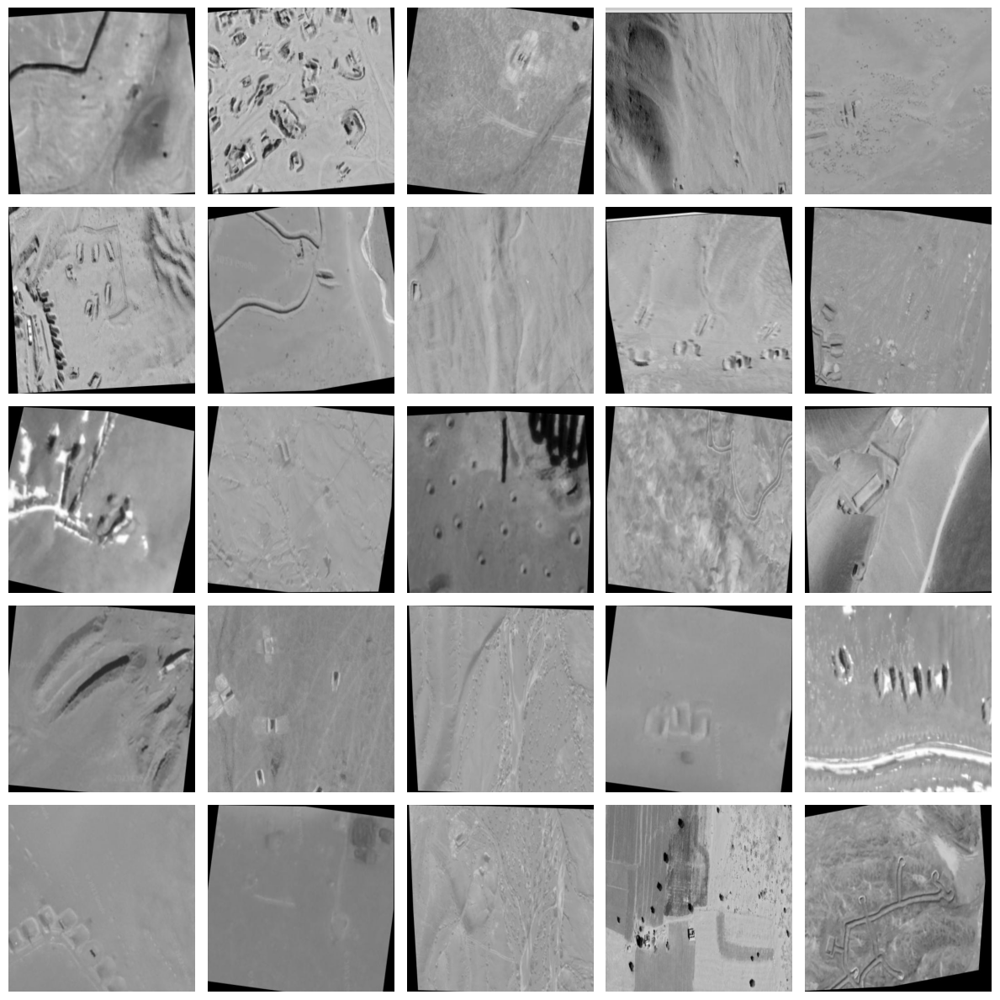

In [ ]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image

# Set the path to the directory containing the images
image_dir = '/content/Obj_Det-4/train/images'

# Get a list of all file names in the directory
all_files = os.listdir(image_dir)

# Filter out directories and select JPEG image files
jpeg_image_files = [file for file in all_files if file.endswith('.jpg') and os.path.isfile(os.path.join(image_dir, file))]

# Select 64 random JPEG image files
num_images = 25
random_jpeg_files = random.sample(jpeg_image_files, num_images)

# Determine the layout of the grid (8x8 layout)
grid_size = 5

# Create a figure and axes for the grid
fig, axes = plt.subplots(grid_size, grid_size, figsize=(12, 12))

# Iterate over the selected image files and display them in the grid
for i, ax in enumerate(axes.flat):
    # Load and display each image
    image_path = os.path.join(image_dir, random_jpeg_files[i])
    image = Image.open(image_path)
    ax.imshow(image)
    ax.axis('off')

# Show the grid of images
plt.tight_layout()
plt.show()


#depicts random images from Obj/train dataset- 64 (8 x 8) training images

In [ ]:
!yolo task=detect mode=train model=yolov8m.pt data={dataset.location}/data.yaml epochs=100 imgsz=640


# Task is to DETECT for TRAINING using model "yolo8m.pt". --->  yolo8m.pt uploaded, trainging batch, CM (label+normal), label, 3 graphs, results

100% 49.7M/49.7M [00:00<00:00, 76.0MB/s]
Ultralytics YOLOv8.0.132 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/Obj_Det-4/data.yaml, epochs=100, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, ker

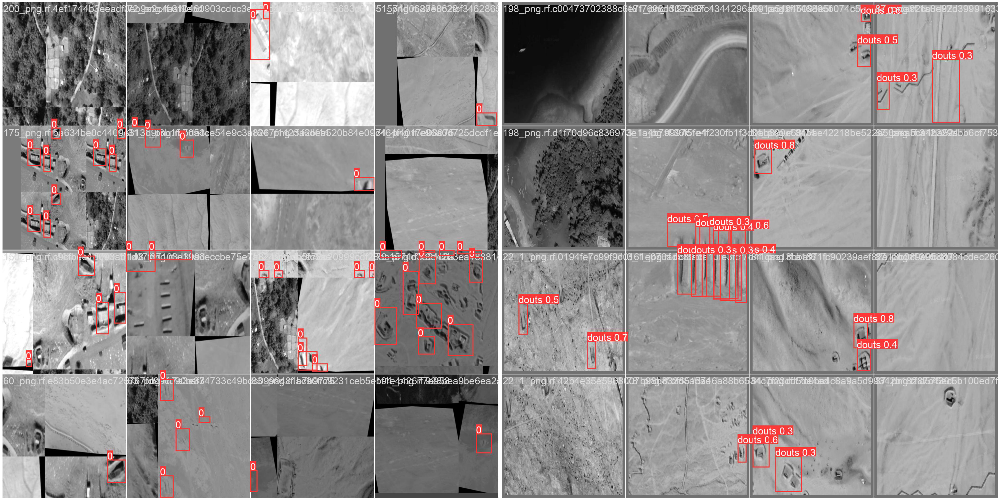

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image

# Path to the four image files
image_paths = [
    '/content/runs/detect/train/train_batch1.jpg',
    '/content/runs/detect/train/val_batch1_pred.jpg'
]

# Create a figure with two subplots arranged horizontally
fig, axes = plt.subplots(1, 2, figsize=(50, 40))

# Decrease the font size
font_size = 8

# Iterate over the image paths and display each image
for i, ax in enumerate(axes):
    image_path = image_paths[i]
    image = Image.open(image_path)
    ax.imshow(image)
    ax.axis('off')
    ax.set_xticks([])  # Hide the x-axis tick labels
    ax.set_yticks([])  # Hide the y-axis tick labels

# Adjust the spacing between subplots
plt.tight_layout()

# Decrease the font size of axis labels
plt.rcParams['axes.labelsize'] = font_size

# Display the images
plt.show()


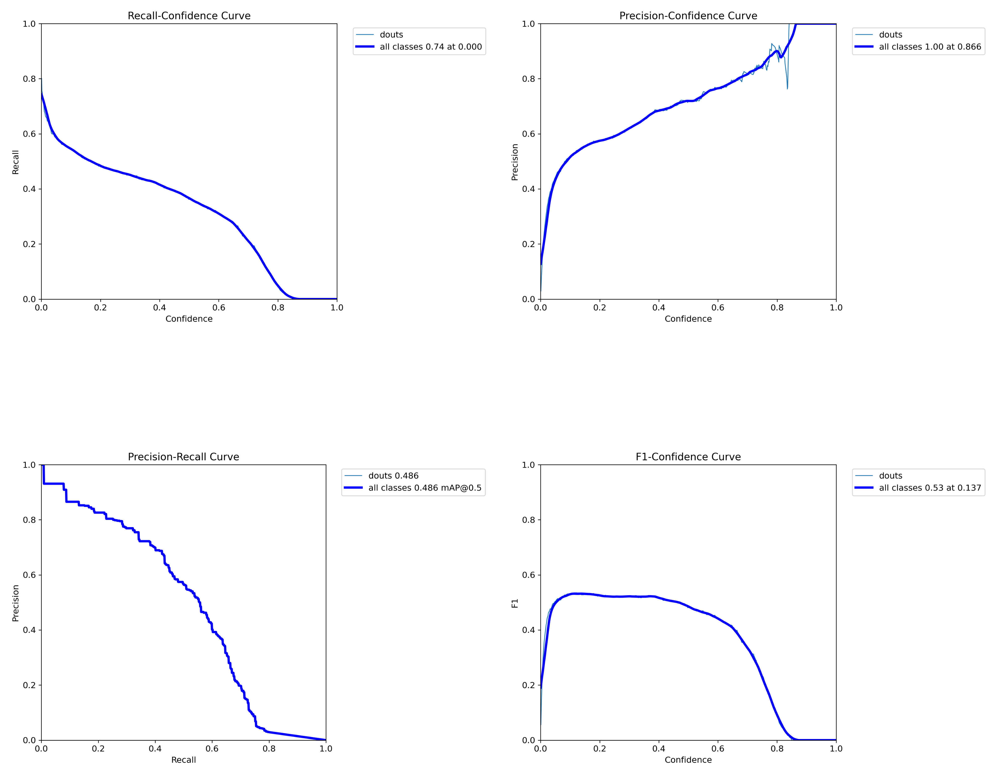

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image

# Path to the four image files
image_paths = [
    '/content/runs/detect/train/R_curve.png',
    '/content/runs/detect/train/P_curve.png',
    '/content/runs/detect/train/PR_curve.png',
    '/content/runs/detect/train/F1_curve.png'
]

# Create a figure with four subplots arranged in a 2 by 2 grid
fig, axes = plt.subplots(2, 2, figsize=(40,40))

# Increase the font size
font_size = 25

# Iterate over the image paths and display each image
for i, ax in enumerate(axes.flat):
    image_path = image_paths[i]
    image = Image.open(image_path)
    ax.imshow(image)
    ax.axis('off')
    ax.tick_params(labelsize=font_size)  # Increase the tick label font size

# Adjust the spacing between subplots
plt.tight_layout()

# Increase the font size of axis labels
plt.rcParams['axes.labelsize'] = font_size

# Display the images
plt.show()


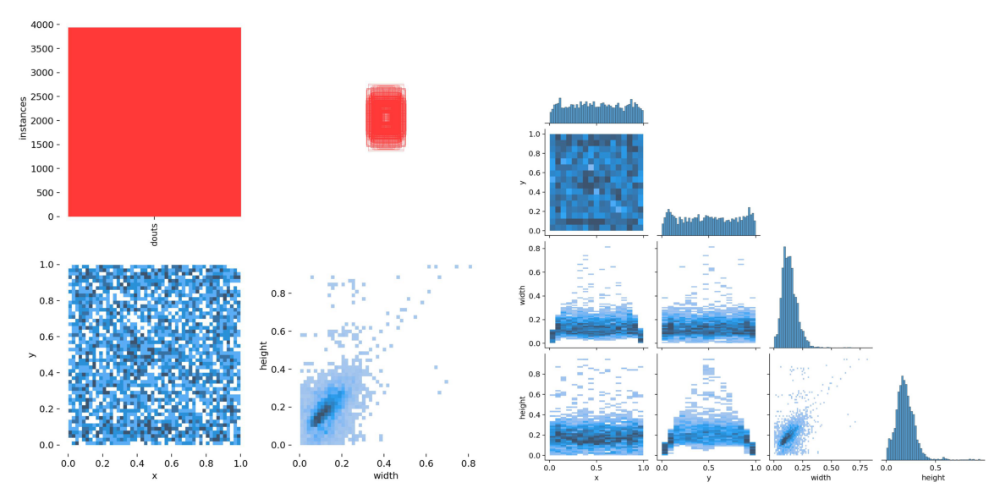

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image

# Path to the two image files
image_paths = [
    '/content/runs/detect/train/labels.jpg',
    '/content/runs/detect/train/labels_correlogram.jpg'
]

# Create a figure with one row and two columns
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Iterate over the image paths and display each image
for i, ax in enumerate(axes):
    image_path = image_paths[i]
    image = Image.open(image_path)
    ax.imshow(image)
    ax.axis('off')

# Adjust the spacing between subplots
plt.tight_layout()

# Display the images
plt.show()


In [ ]:
import pandas as pd

# Path to the CSV file
csv_file_path = '/content/runs/detect/train/results.csv'

# Read the CSV file using pandas
dataframe = pd.read_csv(csv_file_path)

# Display the dataframe
dataframe


,epoch,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,0,2.1093,2.59310,1.9760,0.12182,0.24269,0.06940,0.02000,2.7842,16.6490,3.0355,0.000660,0.000660,0.000660
1,1,2.1077,2.45140,2.0209,0.21294,0.17544,0.10878,0.02475,3.1375,4.9637,3.1469,0.001314,0.001314,0.001314
2,2,2.1107,2.45140,2.0112,0.15865,0.20468,0.07375,0.01993,2.8683,4.1057,2.8525,0.001954,0.001954,0.001954
3,3,2.0842,2.41620,1.9660,0.15744,0.16667,0.06629,0.01963,3.2240,3.4297,3.2447,0.001941,0.001941,0.001941
4,4,1.9972,2.30580,1.9355,0.33009,0.31287,0.22457,0.06680,2.5825,2.7924,2.5588,0.001941,0.001941,0.001941
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,95,1.0414,0.67666,1.2572,0.55381,0.47368,0.45421,0.19516,2.1974,2.0146,2.2598,0.000139,0.000139,0.000139
96,96,1.0442,0.66527,1.2555,0.55202,0.48830,0.46377,0.20438,2.1793,2.0487,2.2252,0.000119,0.000119,0.000119
97,97,1.0487,0.67173,1.2658,0.54934,0.50000,0.46485,0.20472,2.1832,2.0544,2.2381,0.000099,0.000099,0.000099
98,98,1.0322,0.65126,1.2484,0.57186,0.46199,0.44662,0.19831,2.1885,2.0753,2.2430,0.000079,0.000079,0.000079


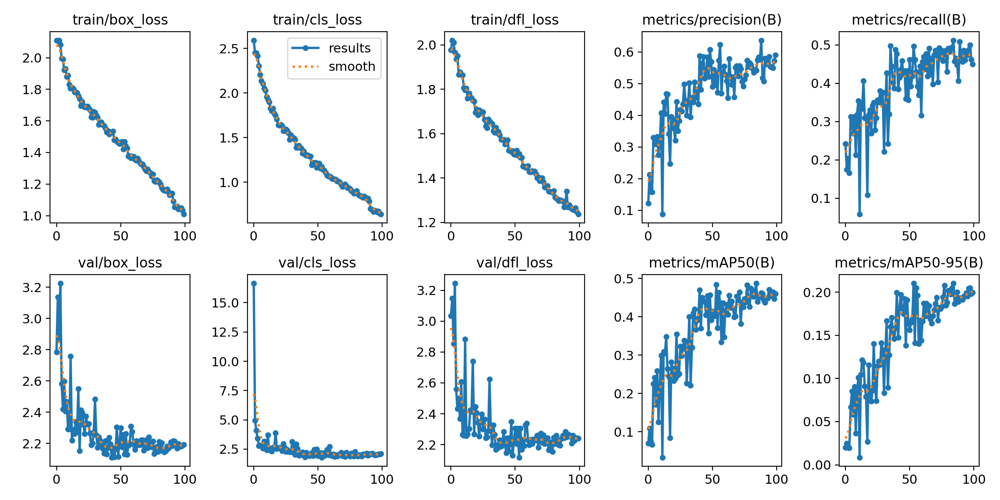

In [ ]:
from IPython.display import Image

Image(filename='/content/runs/detect/train/results.png', width=1000, height=500)


In [ ]:
!yolo task=detect mode=val model=/content/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml

Ultralytics YOLOv8.0.132 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25840339 parameters, 0 gradients
val: Scanning /content/Obj_Det-4/valid/labels.cache... 152 images, 62 backgrounds, 0 corrupt: 100% 152/152 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 10/10 [00:05<00:00,  1.74it/s]
                   all        152        342      0.541      0.514      0.484       0.21
Speed: 2.4ms preprocess, 21.9ms inference, 0.0ms loss, 2.6ms postprocess per image
Results saved to runs/detect/val


In [ ]:
!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt conf=0.25 source={dataset.location}/test/images save_txt=true save_conf=true

Ultralytics YOLOv8.0.132 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25840339 parameters, 0 gradients

image 1/104 /content/Obj_Det-4/test/images/109_png.rf.229ff884fe0f85e1454baae437117101.jpg: 640x640 10 doutss, 37.5ms
image 2/104 /content/Obj_Det-4/test/images/109_png.rf.b2cac67dfbc170858cf1d7cade0071c6.jpg: 640x640 4 doutss, 37.0ms
image 3/104 /content/Obj_Det-4/test/images/109_png.rf.d9f6f79f7a00ad2cc175c0d442a8b136.jpg: 640x640 (no detections), 37.0ms
image 4/104 /content/Obj_Det-4/test/images/109_png.rf.f6881b27197633a20c2ab0dfb2d041bb.jpg: 640x640 6 doutss, 36.9ms
image 5/104 /content/Obj_Det-4/test/images/114_png.rf.22e0144bea7451fd421251a26f465cf0.jpg: 640x640 4 doutss, 22.3ms
image 6/104 /content/Obj_Det-4/test/images/114_png.rf.247b714b126d22ad3666b9bc06da6994.jpg: 640x640 5 doutss, 22.3ms
image 7/104 /content/Obj_Det-4/test/images/114_png.rf.945cc6471a1242d97bbfec4cb703fd7b.jpg: 640x640 3 doutss, 22.3ms
image 8/104 /con

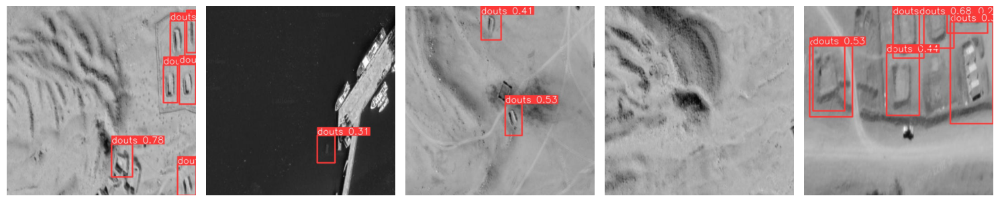

In [ ]:
import glob
from IPython.display import display
from PIL import Image

image_paths = glob.glob('/content/runs/detect/predict3/*.jpg')[:5]

# Create a figure with horizontal subplots
fig, axes = plt.subplots(1, len(image_paths), figsize=(15, 6))

# Iterate over the image paths and display each image
for i, image_path in enumerate(image_paths):
    image = Image.open(image_path)
    ax = axes[i]
    ax.imshow(image)
    ax.axis('off')

# Adjust the spacing between subplots
plt.tight_layout()

# Display the images
plt.show()


In [ ]:
!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt conf=0.25 source= /content/drive/MyDrive/obj/1012.png

Ultralytics YOLOv8.0.132 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25840339 parameters, 0 gradients

image 1/1 /content/drive/MyDrive/obj/1012.png: 384x640 1 douts, 65.3ms
Speed: 2.4ms preprocess, 65.3ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict7


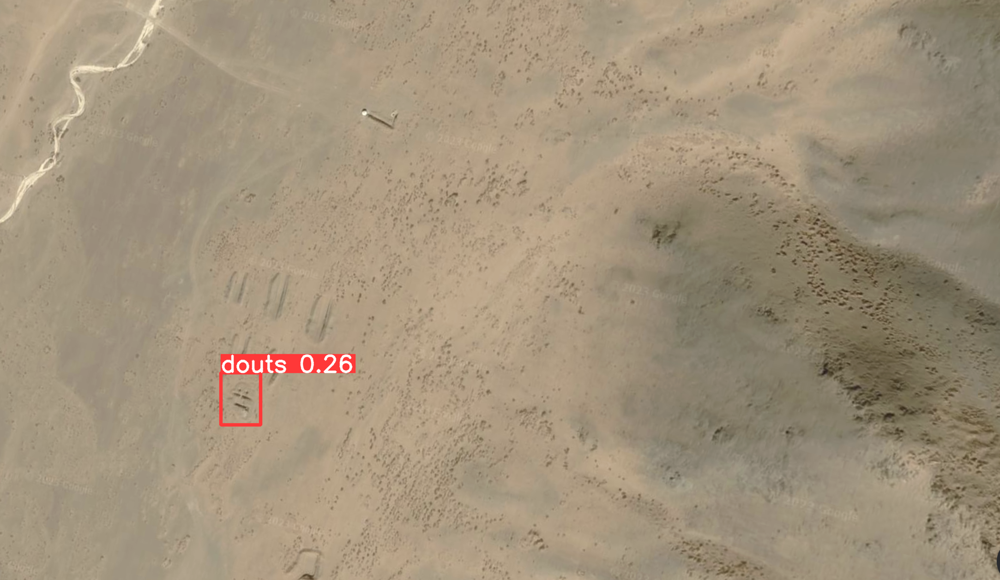

In [ ]:
from IPython.display import Image

Image(filename='/content/runs/detect/predict7/1012.png', width=600)


In [ ]:
#DOWNLOAD "runs"

from google.colab import files
import shutil

# Assuming the 'runs' directory is located at '/content/runs'
shutil.make_archive("/content/runs", 'zip', "/content/runs")

# Download the zipped 'runs' directory
files.download("/content/runs.zip")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>